## Imports

In [1]:
import os
import math

import numpy as np
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import seaborn as sns
sns.set()

In [2]:
import mixtureofconcave as subm
import determinantal as logsubm
import plottingtools

## Load data

### Stanford Dogs

In [3]:
data_dir = os.getcwd() + "/stanforddogs/"

In [4]:
from scipy import io

trdata = {}
io.loadmat(data_dir + "train_data.mat", mdict=trdata);
tedata = {}
io.loadmat(data_dir + "test_data.mat", mdict=tedata);

trainimgs = trdata["train_info"][0][0][0][:,0]
trainimgs = np.array([trainimgs[i].astype(str) for i in range(len(trainimgs))])[:,0]
testimgs = tedata["test_info"][0][0][0][:,0]
testimgs = np.array([testimgs[i].astype(str) for i in range(len(testimgs))])[:,0]
allimgs = np.append(trainimgs, testimgs)
trainimgs = None; testimgs = None

traindata = trdata["train_fg_data"]
print("train data", traindata.shape)
testdata = tedata["test_fg_data"]
print("test data", testdata.shape)
alldata = np.vstack((traindata, testdata))
traindata = None; testdata = None

traincats = trdata["train_info"][0][0][2][:,0].astype(int)
testcats = tedata["test_info"][0][0][2][:,0].astype(int)
allcats = np.append(traincats, testcats)
traincats = None; testcats = None

print("all data:",
      allimgs.shape, "images with",
      alldata.shape, "features in",
      len(np.unique(allcats)), "classes"
     )

train data (12000, 5376)
test data (8580, 5376)
all data: (20580,) images with (20580, 5376) features in 120 classes


In [5]:
## Taking just a subset of the data

catlist = [1,10,11,85,100]

np.random.seed(0)
pick = np.random.choice(np.where(np.isin(allcats, catlist))[0], 200, replace=False)

myimgs = allimgs[pick]
mydata = alldata[pick,:]
mycats = allcats[pick]

pca = PCA(n_components=20)
mydata = pca.fit_transform(mydata)
mydata -= np.min(mydata); mydata = mydata/np.max(mydata)

for c in range(len(catlist)):
    mycats[mycats == catlist[c]] = c

In [11]:
print("design matrix", mydata.shape)
print("labels", mycats.shape, "belonging to", len(np.unique(mycats)), "categories")

design matrix (200, 20)
labels (200,) belonging to 5 categories


We have hereby obtained ``mydata`` containing the disgn matrix, ``mycats`` containing category labels, and ``myimgs`` containing the addresses of the image files.

In [12]:
def plotfromdir(direc, imglist, compact=False):
    L = len(imglist)
    ncol = 10 if compact else np.floor(np.sqrt(L))
    nrow = L//ncol + 1
    
    plt.figure(figsize=(20,20*nrow//ncol))
    for i in range(L):
        plt.subplot(nrow, ncol, i+1)
        img = plt.imread(data_dir + direc + imglist[i])
        plt.axis("off")
        plt.imshow(img)


## Learn a summarizing function interactively (here, through random samples)

#### Obtain dimensions from data

In [13]:
(nn, mm) = mydata.shape
V = np.arange(nn)

kk = nn//10

#### Design Choices

In [14]:
## Modeling
feature_based_func_type = 2 #############
gamma = 100

## Feedback
bb = 4 # number of bits in feedback
noise_sq = 0.01

## Learning
ns = 20
lambda_regul = 1000
zerothresh_flag = 1

## Monitor
monitor_freq = 10

In [15]:
def featurize(matrix, gamma):
    """ f_{1xmm} = log(1+ \sum_{i=1}^kk matrix[i])
    """
    return 0

#### The learning setup

In [16]:
## Priors
mu_0 = np.ones(mm).astype(float)
mu_0 = mu_0/np.sum(mu_0)
sigma_0 = np.identity(mm)

Cinv = lambda_regul * np.linalg.inv(sigma_0) ## mm x mm
Yvec = np.transpose(np.atleast_2d(np.dot(Cinv, mu_0))) ## mm x 1
w_vec = np.squeeze(np.dot(np.linalg.inv(Cinv), Yvec)) ## mm


#### The learning loop

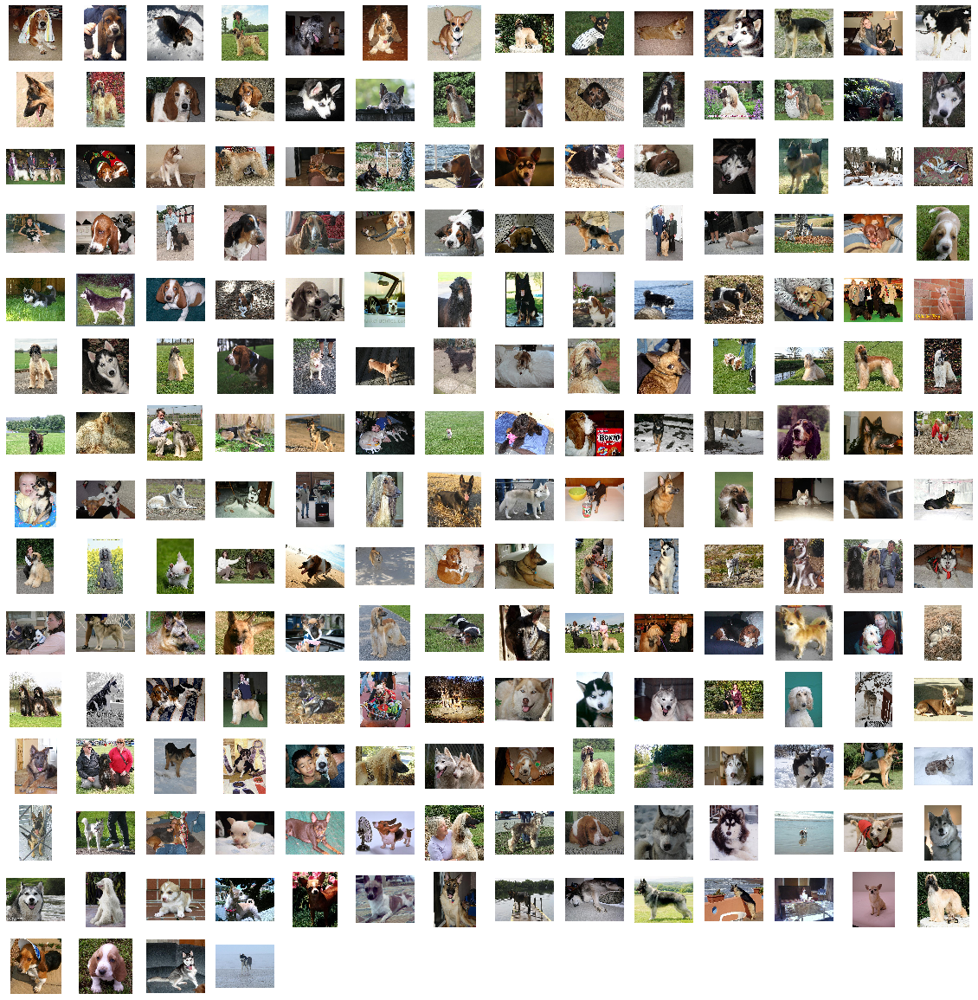

In [17]:
plotfromdir("images/", myimgs)

sample 0 to score


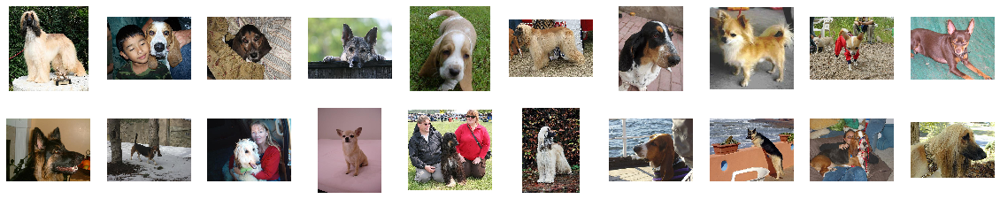

0.9
monitoring ...
is the current greedy solution
sample 1 to score


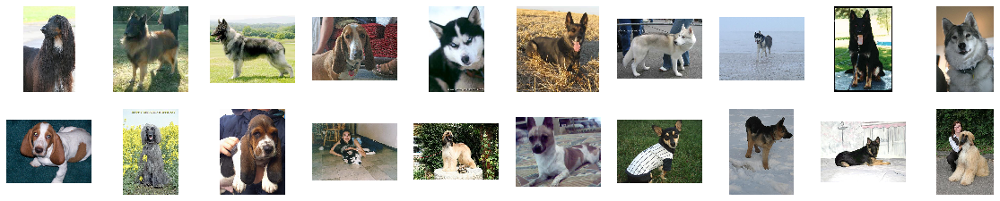

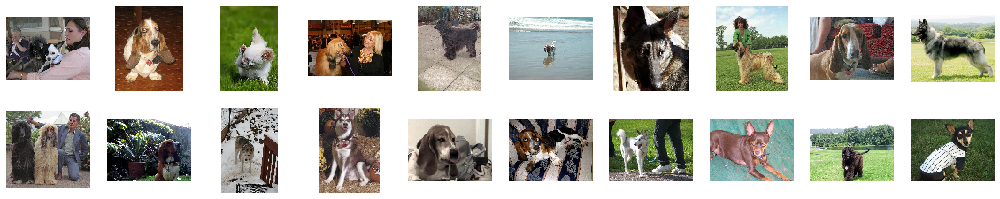

0.7
sample 2 to score


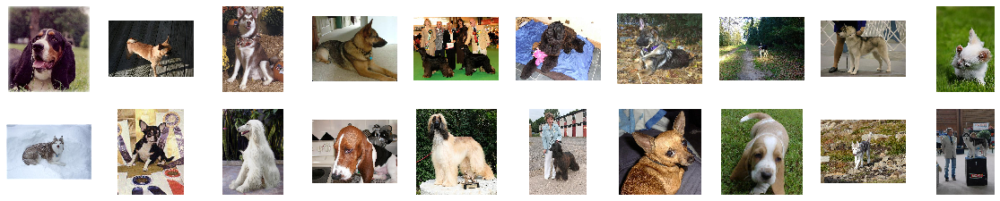

0.6
sample 3 to score


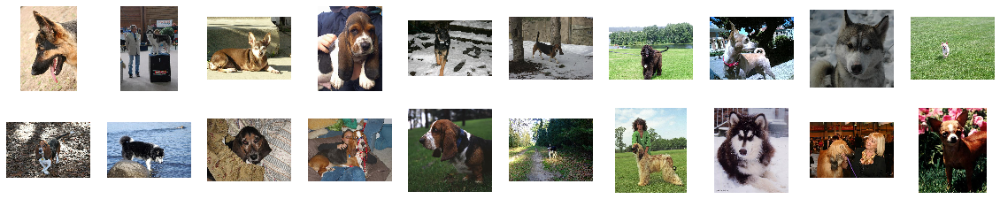

0.6
sample 4 to score


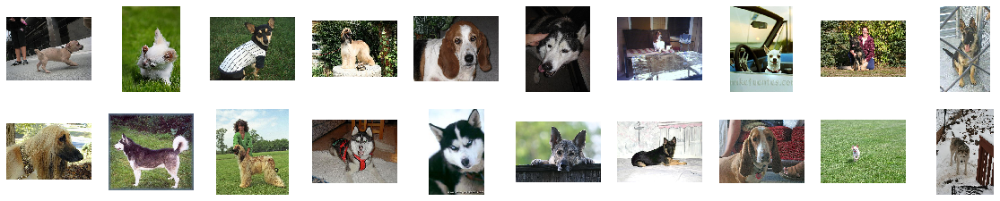

0.4
sample 5 to score


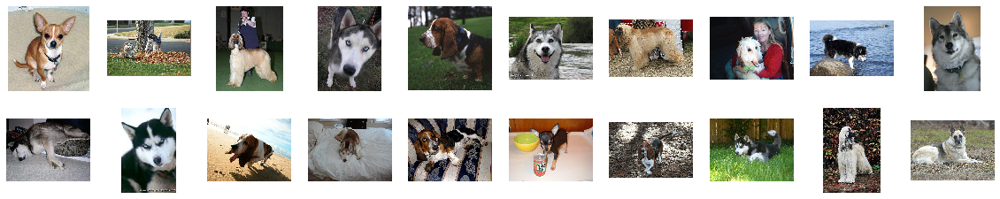

0.4
sample 6 to score


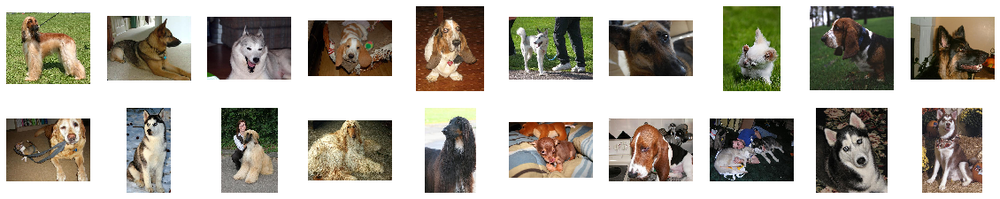

0.2
sample 7 to score


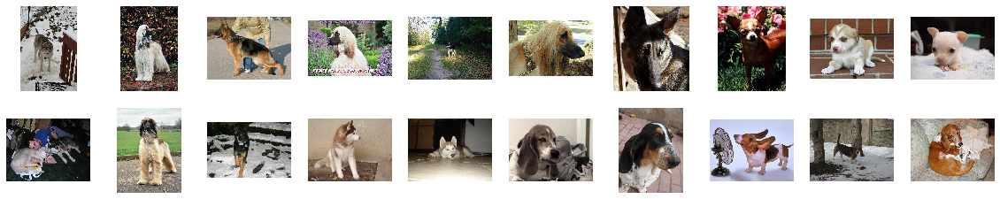

0.2
sample 8 to score


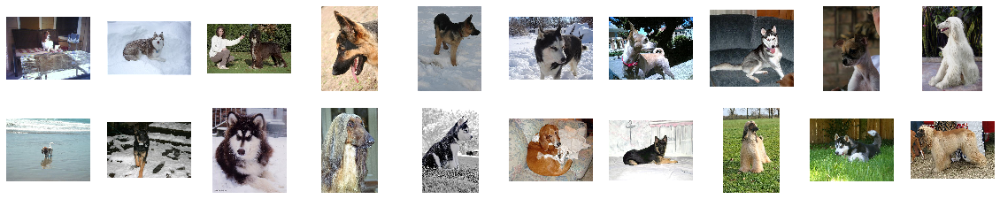

0.2
sample 9 to score


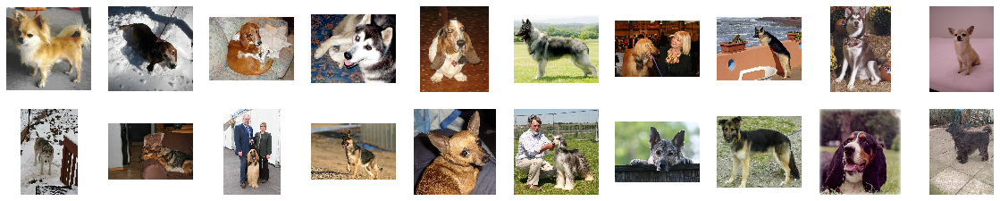

0.5
sample 10 to score


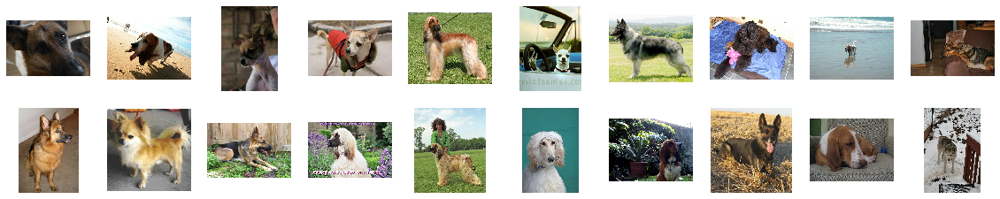

0.3
monitoring ...
is the current greedy solution
sample 11 to score


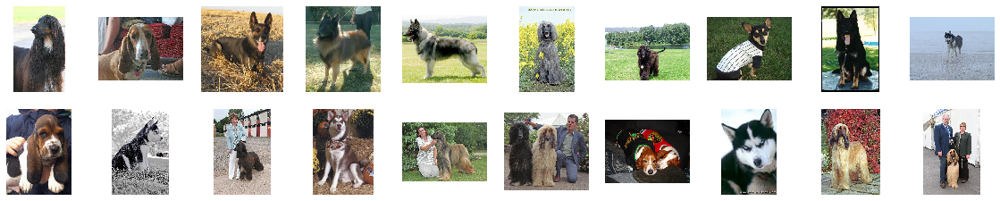

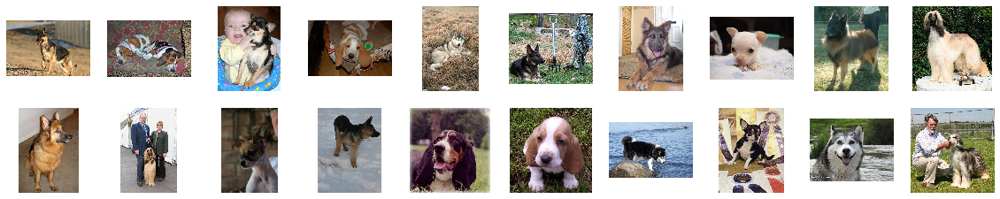

0.9
sample 12 to score


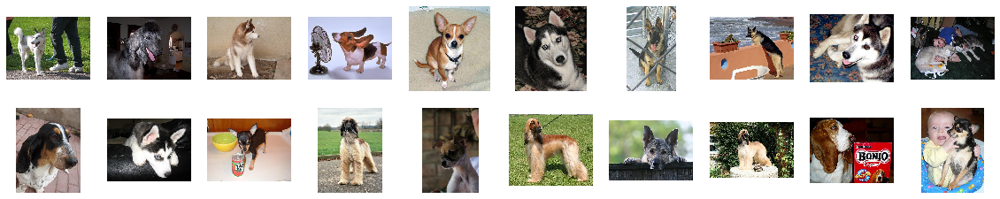

0.95
sample 13 to score


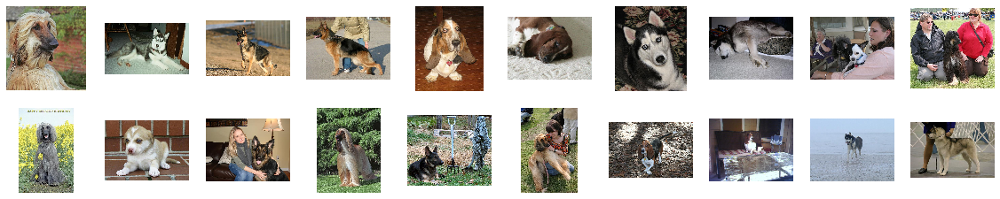

0.7
sample 14 to score


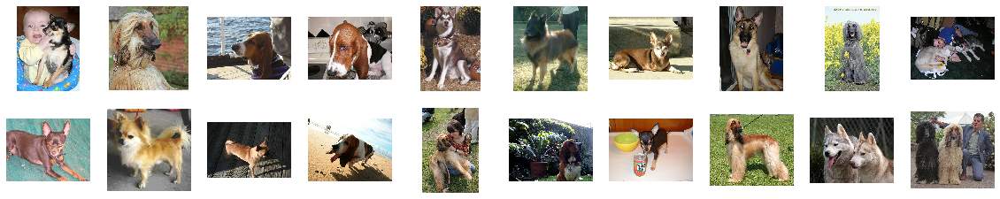

0.7
sample 15 to score


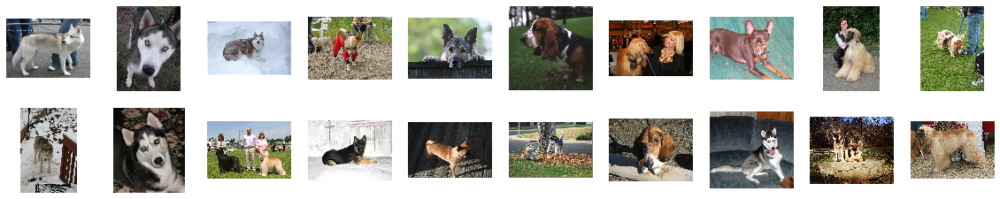

0.5
sample 16 to score


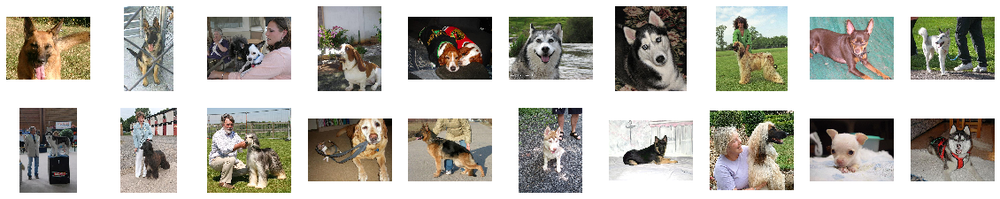

0.95
sample 17 to score


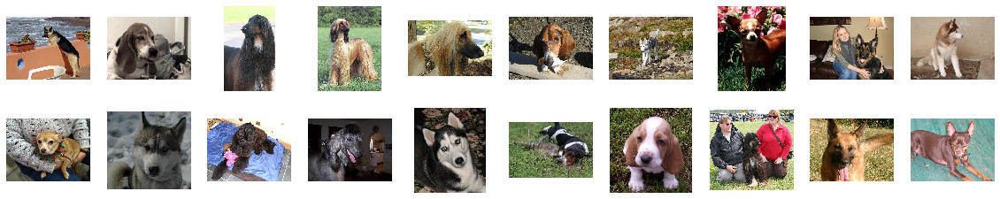

0.9
sample 18 to score


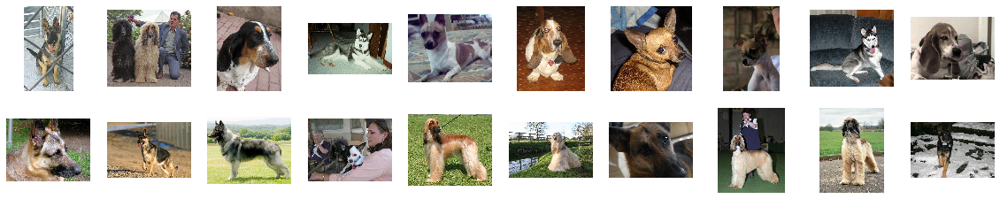

0.4
sample 19 to score


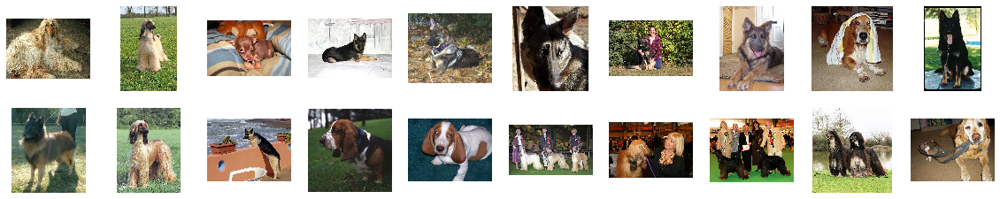

0.3


In [18]:
jdx = 0
while jdx < ns:
    print("sample", jdx, "to score")
    
    w_mediate = w_vec
    
    ## Get a random summary
    SummarySet = np.random.choice(range(nn), kk, replace=False)
    plotfromdir("images/", myimgs[SummarySet], compact=True); plt.show()
    x = np.log(1 + gamma*np.sum(mydata[SummarySet,:], axis=0))
    x = np.expand_dims(x, 1) ## mm x 1
    
    y = input()
    y = float(y)
    
    ## Learn
    Cinv += 1.0/noise_sq * (x @ x.transpose()) ## mm x mm
    Yvec += (1.0/noise_sq) * y * x ## mm x 1
    w_vec = np.squeeze(np.dot(np.linalg.inv(Cinv), Yvec)) ## mm

    if zerothresh_flag == 1:
        w_vec[w_vec<0] = 0
    
    if jdx % monitor_freq == 0:
        print("monitoring ...")
        GreedySet, _ = subm.greedygains_submod(V, mydata, w_vec, kk)
        plotfromdir("images/", myimgs[GreedySet], compact=True)
        print("is the current greedy solution")
    
    jdx += 1

print("thank you for your feedback!\n\n")

is the current greedy solution


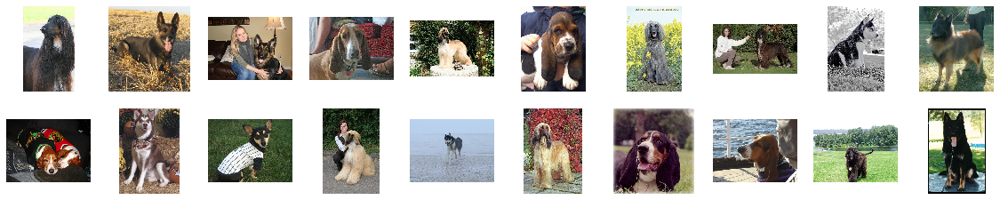

In [19]:
GreedySet, _ = subm.greedygains_submod(V, mydata, w_vec, kk)
plotfromdir("images/", myimgs[GreedySet], compact=True)
print("is the current greedy solution")

In [21]:
print("The learnt weight vector is", w_vec)

The learnt weight vector is [0.         0.00827863 0.         0.01070403 0.00716093 0.
 0.00425933 0.00928892 0.00551428 0.00137357 0.00627121 0.0067895
 0.00814623 0.0046545  0.00222849 0.00116282 0.00203493 0.00878822
 0.00250394 0.00634762]


## Compare unconstrained on true v/s constrained on biased

``w_vec`` and ``mydata`` define the true submodular function. On this, we will run ``subm.greedygains_submod``.<br>
Replaceing ``mydata`` with a biased version will define a biased utility. On this, we will run ``subm.greedyDMquota_submod``<br>

In [26]:
def trueutil(w_vec, mydata, A):
    
    modA = np.sum(mydata[A,:], axis=0)
    fA = np.dot(w_vec, modA**0.2)
    
    return fA

is the current greedy solution


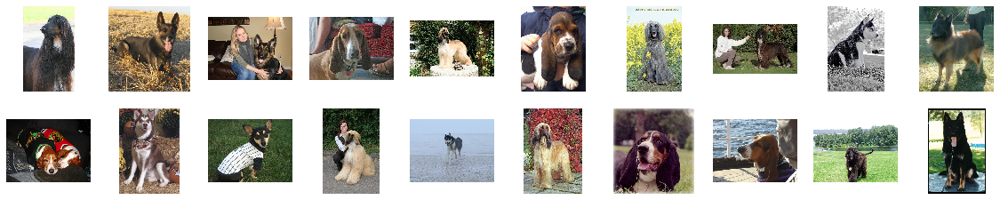

In [24]:
GreedySet, _ = subm.greedygains_submod(V, mydata, w_vec, kk)
plotfromdir("images/", myimgs[GreedySet], compact=True)
print("is the current greedy solution")

In [25]:
print("The greedy summary's category map is", mycats[GreedySet])
print("\n \t The whole category distribution looks like \t", np.bincount(mycats))
print("\n \t The summary's category distribution looks like \t", np.bincount(mycats[GreedySet]))

The greedy summary's category map is [1 3 3 2 1 2 1 1 4 3 2 4 0 1 4 1 2 2 1 3]

 	 The whole category distribution looks like 	 [33 46 43 33 45]

 	 The summary's category distribution looks like 	 [1 7 5 4 3]


In [32]:
rands = [trueutil(w_vec, mydata, np.random.choice(200, 20)) for i in range(100)]
print("The true function valuation of 100 random sets lies within", np.min(rands), np.max(rands))
print("The true function valuation of this set is", trueutil(w_vec, mydata, GreedySet))

The true function valuation of 100 random sets lies within 0.13921250525281428 0.14081164907911142
The true function valuation of this set is 0.14268715089812534


In [ ]:
#template : greedyDMquota_submod(V, X, mixw, Memvec, quo, k, verbose=False)

In [ ]:
GreedyDMQSet, _ = subm.greedyDMquota_submod(V, mydata, w_vec, zzzzMemvec, zzzzquo, kk)

## Learn a V-rouge summarizing function (through gold-standard summaries)

In [ ]:
def score_image_summarization(subset, Feature_Vec, eval_summary):
    """
    Returns the v-rouge evaluation of the selected subset eval_summary
    subset : the array of 208 "true" subsets selected by humans
    """
    subset = np.array(subset)[0] ## 208 x 10
    subset = np.array([subset[i][:,0].astype(int) for i in range(len(subset))])
    #subset = subset.astype(int)
    Feature_Vec = np.array(Feature_Vec) ## 100 x 628
    eval_summary = np.array(eval_summary)
    eval_summary = eval_summary.astype(int)
    
    score = 0;
    
    val_vec = np.array([[0.0,]*np.ma.size(Feature_Vec, 1) for i in range(len(subset))]) ## 208 x 628
    eval_val_vec = np.sum(Feature_Vec[eval_summary,:], axis=0) ## 628 (all rows of a 10 x 628 matrix summed)
    
    for idx in range(len(subset)):
        z2 = np.array(list(subset[idx])) -1 ## 10
        #since these are python indices
        #change this when you change preprocessing
        val_vec[idx,:] = np.sum(Feature_Vec[z2,:], axis=0)
        score = score + np.sum(np.minimum(val_vec[idx,:], eval_val_vec))
        
    scale_val = score
    score = float(score) / float(np.sum(val_vec))
    #eval_val_vec = zeros(1, size(Feature_Vec,2));
    #sum(min(x, val_vec))
    
    return (score, scale_val)